# <font color="#5fa8d3"> Creating the dataset


## <font color="#62b6cb"> Table of Content <a name="ToC"></a>
0. [Libraries Importation & Funtions Definition](#id0)<br>
1. [Anlysis of data](#id1)<br>
    1.1 [Example](#id11)<br>
2. [Train set](#id2)<br>
    2.1 [Coco format](#id21)<br>
    2.2 [Breaking down a damage category by severity](#id22)<br>
    2.3 [Change classes' id](#id23)<br>
    2.4 [Split in train and validation sets](#id24)<br>
3. [Test](#id3)<br>
    3.3 [Read test set](#id31)<br>
    3.2 [Coco format](#id32)<br>
    3.3 [Breaking down a damage category by severity](#id33)<br>
    3.4 [Change classes' id](#id34)<br>
    3.5 [Test folder](#id35)<br>

## <font color="#62b6cb"> 0. Libraries Importation, Parameters & Funtions Definition <a name="id0"></a>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import json
from IPython.display import clear_output, display
import datetime
import random
import shutil
import ipywidgets as widgets

In [68]:
# PARAMETERS
# paths
kaggle_json_train  = "./archive/train.json"
kaggle_json_val = "./archive/val.json"
image_path = ".\\archive\\image\\image\\01012020_172204image853193.jpg"
train_path_original = ".\\archive\\image\\image"
test_path_original = ".\\archive\\validation\\validation"
train_annotations_json = "annotations.json"
val_annotations_json = "annotations.json"
test_annotations_json = "annotations.json"
output_json_severity_path = ".\\archive\\image\\annotation_severity.json"
output_json_severity_path_test = ".\\archive\\validation\\annotation_severity.json"
temp_state_path = ".\\archive\\image\\temp_state.json"
temp_state_path_test = ".\\archive\\validation\\temp_state.json"
path_split = ".\\CustomImages\\" # folder with sets of train, val and test
folder_train_split = "train"
folder_val_split = "val"
folder_test_split = "test"
folder_old_annnotations_train = "old_json_train"
folder_old_annnotations_test = "old_json_test"

# class name 
class_name = "met_dent"

# class break down dented
dented_severity_apply_train = 0
dented_severity_apply_test = 0

# Porcentaje de división
val_percentage = 0.2

# replace the classes
mapping = {
    "mat_bo_phan": "mis_lost",
    "rach": "met_tear",
    "mop_lom": "met_dent",
    "tray_son": "met_scratch",
    "thung": "mis_punct",
    "vo_kinh": "glass_crack",
    "be_den": "mis_lamp"
}

# Dictionary for converting the classes id
old_to_new_ids = {
    1: 1,
    2: 2,
    4: 3,
    5: 4,
    6: 5,
    7: 6,
    8: 7,
    9: 8,
    10: 9
}

# Update the categories
new_categories = [
    {'id': 1, 'name': 'mis_lost', 'supercategory': 'car_damage'},
    {'id': 2, 'name': 'met_tear', 'supercategory': 'car_damage'},
    {'id': 3, 'name': 'met_scratch', 'supercategory': 'car_damage'},
    {'id': 4, 'name': 'glass_crack', 'supercategory': 'car_damage'},
    {'id': 5, 'name': 'mis_punct', 'supercategory': 'car_damage'},
    {'id': 6, 'name': 'mis_lamp', 'supercategory': 'car_damage'},
    {'id': 7, 'name': 'met_dent_minor', 'supercategory': 'met_dent'},
    {'id': 8, 'name': 'met_dent_medium', 'supercategory': 'met_dent'},
    {'id': 9, 'name': 'met_dent_severe', 'supercategory': 'met_dent'}
]



In [ ]:
def calculate_bounding_box(row):
    """
   Obtain the rectangles to indicate the damages of the car.

    Args:
        row (pd.Series): series of the damage of the image.

    Returns:
        rectangle (pd.Series): serie of the rectangle of the damage.
    """    
    min_x = min(row["all_x"])
    max_x = max(row["all_x"])
    min_y = min(row["all_y"])
    max_y = max(row["all_y"])
    
    x = min_x
    y = min_y
    width = max_x - min_x
    height = max_y - min_y

    rectangle = pd.Series([x, y, width, height], index=["x_rect", "y_rect", "width_rect", "height_rect"])  
    return rectangle

In [ ]:
def dataframe_to_coco_format(df, categories):
    """
   Convert DataFrame to COCO format.

    Args:
        df (pd.DataFrame): DataFrame with the data.
        categories (list): list of categories.

    Returns:
        dict: dictionary in COCO format.
    """
    coco_format = {
        "info": {
            "description": "Vehide",
            "url": "https://www.kaggle.com/datasets/syedanwarafridi/vehicle-sales-data",
            "version": "0.1.0",
            "year": "2024",
            "contributor": "Daniel_Teresa",
            "date_created": "datetime.datetime.now().isoformat()"
        },
        "licenses": [
            {
                "id": 1,
                "name": "",
                "url": ""
            }
        ],
        "categories": [
            {"id": i + 1, "name": name, "supercategory": "car_damage"} for i, name in enumerate(categories)
        ],
        "images": [],
        "annotations": []
    }

    
    annotation_id = 1
    for id, image_name in enumerate(df["name"].unique()):
        df_image = df[ df["name"]== image_name]
        row = df_image.iloc[0]
        image_info = {
                "id": id + 1,
                "file_name": row["name"],
                "width": row["width"],
                "height": row["height"],
                "date_captured": datetime.datetime.now().isoformat(),
                "license": 1,
                "coco_url": "",
                "flickr_url": ""
            }
        coco_format["images"].append(image_info)  
        
        
        for idx, row in df_image.iterrows():
            bbox = [row["x_rect"], row["y_rect"], row["width_rect"], row["height_rect"]]
            area = row["width_rect"] * row["height_rect"]
            segmentation = []
            for x,y in zip(row["all_x"], row["all_y"]):
                segmentation.append(x)
                segmentation.append(y)
            annotation = {
                    "id": annotation_id,
                    "image_id": id + 1,
                    "category_id": categories.index(row["class"]) + 1,
                    "iscrowd": 0,
                    "area": area,
                    "bbox": bbox,
                    "segmentation": [segmentation],
                    "width": row["width"], #WIDTH CHECKEAR
                    "height": row["height"]
            }
            coco_format["annotations"].append(annotation)
            annotation_id += 1
            
    return coco_format


In [ ]:
def extract_coco_data(coco_data, class_name):
    """
    Extracts image names and polygons for a specified class from a COCO format JSON file.

    Parameters:
    coco_data (dict): dictionary with the coco format for the images.
    class_name (str): The name of the class to filter annotations.

    Returns:
    dict: A dictionary where keys are image names and values are lists of polygons.
    """

    # Extract categories to find the category id for the specified class
    category_id = None
    for category in coco_data.get("categories", []):
        if category["name"] == class_name:
            category_id = category["id"]
            break

    # Raise an error if the class name is not found
    if category_id is None:
        raise ValueError( f"Class \"{class_name}\" not found in categories.")

    # Create a dictionary to map image ids to image names
    image_id_to_name = {image["id"]: image["file_name"] for image in coco_data.get("images", [])}

    # Create a dictionary to store the results
    results = {}

    # Extract annotations for the specified class
    for annotation in coco_data.get("annotations", []):
        if annotation["category_id"] == category_id:
            image_id = annotation["image_id"]
            image_name = image_id_to_name.get(image_id, "Unknown")
            polygons = annotation.get("segmentation", [])

            if image_name not in results:
                results[image_name] = []

            results[image_name].extend(polygons)

    return results



In [ ]:
def plot_photo_df(image_path, image_name, data_class):
    """
    Plots the specified image with polygons and bounding boxes using the provided data dictionary.

    Parameters:
    image_path (str): Path to the directory containing the images.
    image_name (str): Name of the image file to be plotted.
    data_class (dict): Dictionary containing polygon and bounding box data.
    """
    # Construct the full image path
    full_image_path = os.path.join(image_path, image_name)

    # Read the image
    image = cv2.imread(full_image_path)

    # Convert image to RGB
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Check if the image name exists in the data dictionary
    if image_name not in data_class:
        print(f"Image \"{image_name}\" not found in data_class.")
        return

    # Get the polygons from the data dictionary
    polygons = data_class[image_name]

    # Iterate through each polygon and plot it
    for polygon in polygons:
        x_coords = []
        y_coords = []

        # Separate x and y coordinates
        for i in range(0, len(polygon), 2):
            x_coords.append(polygon[i])
            y_coords.append(polygon[i + 1])

        polygon_points = np.array(list(zip(x_coords, y_coords)), np.int32)
        polygon_points = polygon_points.reshape((-1, 1, 2))
        # Draw polygons
        cv2.polylines(image_rgb, [polygon_points], isClosed=True, color=(0, 255, 0), thickness=2)

    plt.figure(figsize=(10, 10))
    plt.imshow(image_rgb)
    plt.axis("off") 
    plt.show()

In [ ]:
def classify_damage_and_update_json(input_path, json_name, class_name, output_json_path):
    """
    Classifies damage severity for a specified class in a COCO format JSON file and updates the JSON.

    Parameters:
    input_path (str): Path to the directory containing the input COCO format JSON file.
    json_name (str): Name of the input COCO format JSON file.
    class_name (str): The name of the class to classify damages.
    output_json_path (str): Path to save the updated COCO format JSON file.
    """
    # Read the COCO format JSON file
    with open(os.path.join(input_path, json_name), "r") as f:
        coco_data = json.load(f)

    # Extract categories to find the category id for the specified class
    category_id = None
    for category in coco_data.get("categories", []):
        if category["name"] == class_name:
            category_id = category["id"]
            break

    # Raise an error if the class name is not found
    if category_id is None:
        raise ValueError(f"Class \"{class_name}\" not found in categories.")

    # Create a dictionary to map image ids to image names
    image_id_to_name = {image["id"]: image["file_name"] for image in coco_data.get("images", [])}

    # Create a new category for each type of damage
    new_categories = []
    for damage_type in ["minor", "medium", "severe"]:
        new_categories.append({
            "supercategory": class_name,
            "id": len(coco_data["categories"]) + len(new_categories) + 1,
            "name": f"{class_name}_{damage_type}"
        })
    # Append new categories to the existing categories in coco_data
    coco_data["categories"].extend(new_categories)

    # Get the new category ids
    new_category_ids = {cat["name"]: cat["id"] for cat in coco_data["categories"] if class_name in cat["name"]}

    # Initialize counters
    total_annotations = len([annotation for annotation in coco_data["annotations"] if annotation["category_id"] == category_id])

    annotations = [ann for ann in coco_data["annotations"] if ann["category_id"] == category_id]

    dropdown = widgets.Dropdown(
        options=[("Select classification", 0), ("Minor", 1), ("Medium", 2), ("Severe", 3)],
        description="Damage:",
        disabled=False,
    )
    
    next_button = widgets.Button(description="Next")
    output = widgets.Output()
    
    processed_annotations = 0

    def on_next_button_clicked(b):
        nonlocal processed_annotations
        damage_class = dropdown.value
        
        if damage_class not in [1, 2, 3]:
            print("Please select a valid damage classification before proceeding.")
            return
        
        # Map user input to new category name
        if damage_class == 1:
            new_category_name = f"{class_name}_minor"
        elif damage_class == 2:
            new_category_name = f"{class_name}_medium"
        elif damage_class == 3:
            new_category_name = f"{class_name}_severe"
        
        # Update the annotation with the new category id
        annotation = annotations[processed_annotations]
        annotation["category_id"] = new_category_ids[new_category_name]
        
        processed_annotations += 1
        
        # Check if there are more annotations to process
        if processed_annotations < total_annotations:
            display_next_image()
        else:
            save_and_exit()

    def display_next_image():
        clear_output(wait=True)
        annotation = annotations[processed_annotations]
        image_id = annotation["image_id"]
        image_name = image_id_to_name.get(image_id, "Unknown")
        polygons = annotation.get("segmentation", [])

        # Read the image
        full_image_path = os.path.join(input_path, image_name)
        image = cv2.imread(full_image_path)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Draw polygons
        for polygon in polygons:
            x_coords = []
            y_coords = []

            # Separate x and y coordinates
            for i in range(0, len(polygon), 2):
                x_coords.append(polygon[i])
                y_coords.append(polygon[i + 1])

            polygon_points = np.array(list(zip(x_coords, y_coords)), np.int32)
            polygon_points = polygon_points.reshape((-1, 1, 2))

            cv2.polylines(image_rgb, [polygon_points], isClosed=True, color=(0, 255, 0), thickness=2)

        # Display the image
        plt.figure(figsize=(7, 7))
        plt.imshow(image_rgb)
        plt.axis("off")
        plt.title(f"{processed_annotations + 1} of {total_annotations} annotations")
        plt.show()
        
        # Reset dropdown for next image
        dropdown.value = 0

        # Display the dropdown and buttons
        display(dropdown, next_button, output)
    
    def save_and_exit():
        # Remove the old category from coco_data["categories"]
        coco_data["categories"] = [cat for cat in coco_data["categories"] if cat["id"] != category_id]

        # Save the updated JSON file with indentation
        with open(output_json_path, "w") as f:
            json.dump(coco_data, f, indent=4)

        print(f"Updated JSON saved to {output_json_path}")

    # Assign the button click event handlers
    next_button.on_click(on_next_button_clicked)

    # Start processing the first image
    if annotations and processed_annotations < total_annotations:
        display_next_image()
    else:
        print("No annotations found for the specified class.")

# # Example usage
# json_name = "annotatio"
# class_name = "damage"
# output_json_path = ".\\archive\\image\\prueba_salida.json"
# temp_state_path = ".\\archive\\image\\temp_state.json"

# classify_damage_and_update_json(train_path_original, json_name, class_name, output_json_path, temp_state_path)


In [ ]:
def count_category_occurrences(coco_json_path):
    """
    Count the number of times of each oft he categories of a Coco format appears in the annotations part

    Args:
        coco_jso _path (str): path of the annotations file.


    Outputs:
        category_counts (dict) : dictionary with the name of the categories and the number of times that appears each one.
    """
    # Leer el archivo JSON
    with open(coco_json_path, 'r') as f:
        coco_data = json.load(f)
    
    # Crear un diccionario para mapear ids de categorías a nombres
    category_id_to_name = {category['id']: category['name'] for category in coco_data['categories']}
    
    # Inicializar un diccionario para contar las apariciones de cada categoría
    category_counts = {category['name']: 0 for category in coco_data['categories']}
    
    # Contar las apariciones de cada categoría en las anotaciones
    for annotation in coco_data['annotations']:
        category_id = annotation['category_id']
        category_name = category_id_to_name[category_id]
        category_counts[category_name] += 1
    
    return category_counts


## <font color="#62b6cb"> 1. Analysis of data <a name="id1"></a>



The train json of Kaggle is read

In [3]:
# Read the JSON file
with open( kaggle_json_train, "r") as file:
    data = json.load(file)

# Prepare the list to store the extracted information
data_list = []

# keys of data are the name of images
# Extract information from the JSON data

for image_name, image_info in data.items():
    for region in image_info["regions"]:
        region_data = {
            "name": image_name,
            "all_x": region["all_x"],
            "all_y": region["all_y"],
            "class": region["class"]
        }
        data_list.append(region_data)

# Create a DataFrame from the extracted information
df = pd.DataFrame(data_list)

the keys of data are the name of the images. Each name of the image has a dict associated with the name of the image ("name") 
and  a list (the key is called "region") with dictionaries indicating the different damages of the car. Each of the 
damage is a dictionary with attributes all_x, all_y and class:

* all_x: x coordinates of the polygon
* all_y: y coordinates of the polygon
* classes: class of the damage

**Classes explanation**

The name of the labels is in Vietnamese so we are going to change them so it is easier to intrepretate them.

* mat_bo_phan = lost parts (Miscellaneous Damage) - mis_lost
* rach = torn (Metal damage tear) -  met_tear
* mop_lom = dented (Metal damage dent) -  met_dent
* tray_son = paint scratches (Metal damage scratches) -  met_scratch
* thung = puncture (Miscellaneous Damage) -  mis_punct
* vo_kinh = broken glass (Glass damage crack) -  glass_crack
* be_den = broken lamp (Miscellaneous Damage) - mis_lamp

In addition, The number of elements by classes is checked. It can be seen that the data is not balanced. Therefore, it will be done a data augmentation to gain more information about the classes

In [5]:
df["class"] = df["class"].replace(mapping)


print("Number of elments classification:",df.shape)
print("Number of photos:", len(df["name"].unique()))
print(df["class"].value_counts())

Number of elments classification: (30046, 4)
Number of photos: 11621
class
met_scratch    12267
met_dent        4709
met_tear        4546
mis_lost        2370
mis_lamp        2324
mis_punct       2006
glass_crack     1824
Name: count, dtype: int64


Create the rectangles indicating the damages

In [7]:

# The calculation of the boxes is done to each row (each damage)
bounding_boxes = df.apply(calculate_bounding_box, axis=1)

# add the boxes to the dataframe
df = df.join(bounding_boxes)
df.head(2)

,name,all_x,all_y,class,x_rect,y_rect,width_rect,height_rect
0,01012020_172204image853193.jpg,"[1, 30, 81, 79, 74, 65, 63, 65, 83, 100, 126, ...","[107, 118, 184, 157, 131, 98, 86, 83, 110, 165...",mis_lost,1,1,446,577
1,01012020_172204image853193.jpg,"[395, 457, 528, 621, 667, 705, 752, 772, 792, ...","[256, 264, 267, 267, 268, 277, 294, 301, 300, ...",met_tear,389,231,410,70


### <font color="#62b6cb"> 1.1 Example <a name="id11"></a>

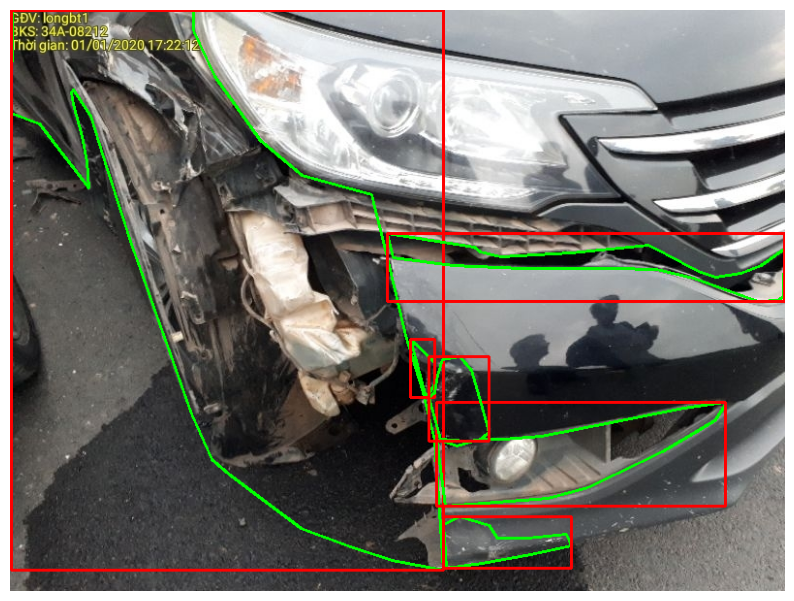

In [8]:
df_example = df[df["name"]=="01012020_172204image853193.jpg"]

image = cv2.imread(image_path)

# IMage is converted to RGB
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Plotting the boxes and polygons of the image
for index, row in df_example.iterrows():
    # Coordinates of the polygon
    polygon_points = np.array(list(zip(row["all_x"], row["all_y"])), np.int32)
    polygon_points = polygon_points.reshape((-1, 1, 2))
    # Potting the polygon
    cv2.polylines(image_rgb, [polygon_points], isClosed=True, color=(0, 255, 0), thickness=2)
    
    # Box 
    x_rect = int(row["x_rect"])
    y_rect = int(row["y_rect"])
    width = int(row["width_rect"])
    height = int(row["height_rect"])
    
    # Poltting the box
    cv2.rectangle(image_rgb, (x_rect, y_rect), (x_rect + width, y_rect + height), (255, 0, 0), 2)

# Showing an example
plt.figure(figsize=(10, 10))
plt.imshow(image_rgb)
plt.axis("off")  
plt.show()

## <font color="#62b6cb"> 2 Train set <a name="id2"></a>

### <font color="#62b6cb"> 2.1 Coco format <a name="id21"></a>

For the image augmentation, it will be necessary to have the information in Coco format (https://auto.gluon.ai/stable/tutorials/multimodal/object_detection/data_preparation/convert_data_to_coco_format.html).


In [9]:
# For being able to apply the augmentation, the json of the training needs to be in coco format and the width and
# height has to be in the dataframe

df["width"] = pd.NA
df["height"] = pd.NA

# name of training images
img_names = os.listdir(train_path_original)

# adding the width and the height of each of the images
for name in img_names:
    img_path = os.path.join(train_path_original, name)
    img = cv2.imread(img_path)

    if img is not None:
        height, width, _ = img.shape
        df.loc[df[df["name"] == name].index, "width" ] = width
        df.loc[df[df["name"] == name].index, "height" ]= height

In [12]:
# Convert to JSON string
coco_format = dataframe_to_coco_format(df, list(df["class"].unique()))
coco_json = json.dumps(coco_format, indent=4)

# Save to a JSON file
with open(os.path.join(train_path_original, train_annotations_json ), "w") as f:
    f.write(coco_json)

df.to_csv("df_width_height.csv")

### <font color="#62b6cb"> 2.2 Breaking down a damage category by severity <a name="id22"></a>

As we want to create car damage budgets, some variables can be break down by severity so it  is possible to give better estimation of the prices to fix the cars. 

In [13]:
# read JSON
with open(os.path.join(train_path_original, train_annotations_json  ), "r") as f:
    coco_data = json.load(f)

In [15]:
data_class = extract_coco_data(coco_data, class_name)

16012020_162226image894568.jpg


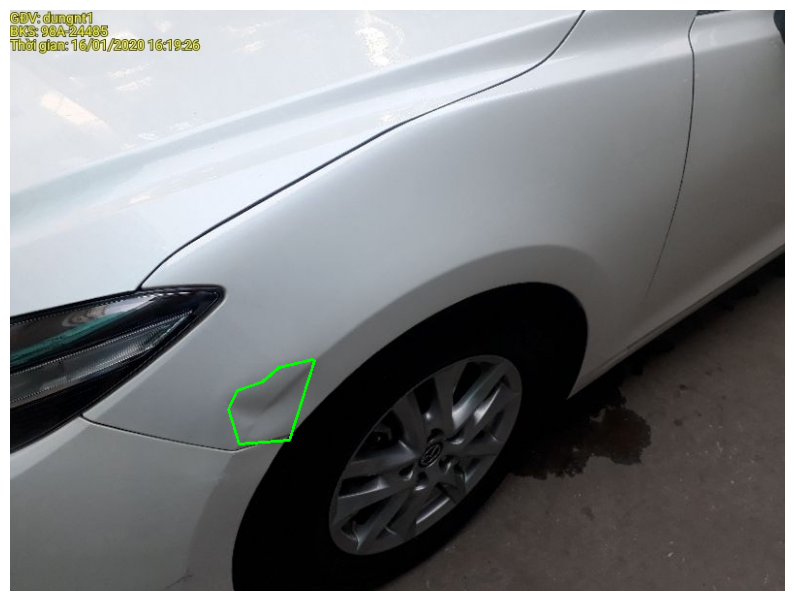

20012020_083216image204757.jpg


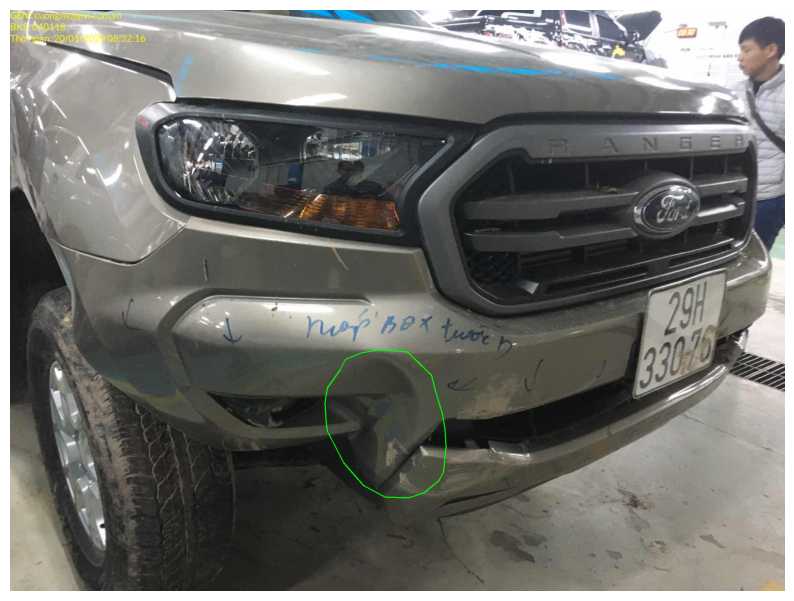

13012020_090844image700733.jpg


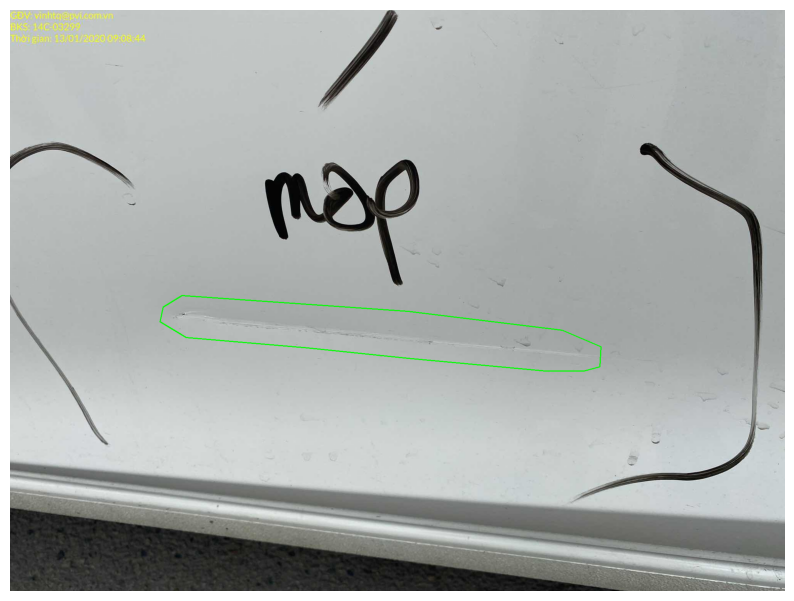

16012020_082534image704362.jpg


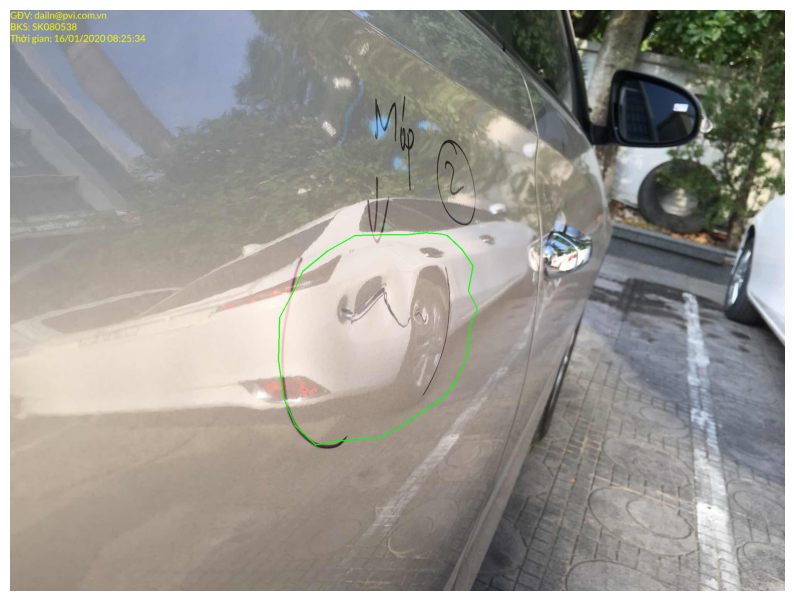

7d007b9764ef9cb1c5fe.jpg


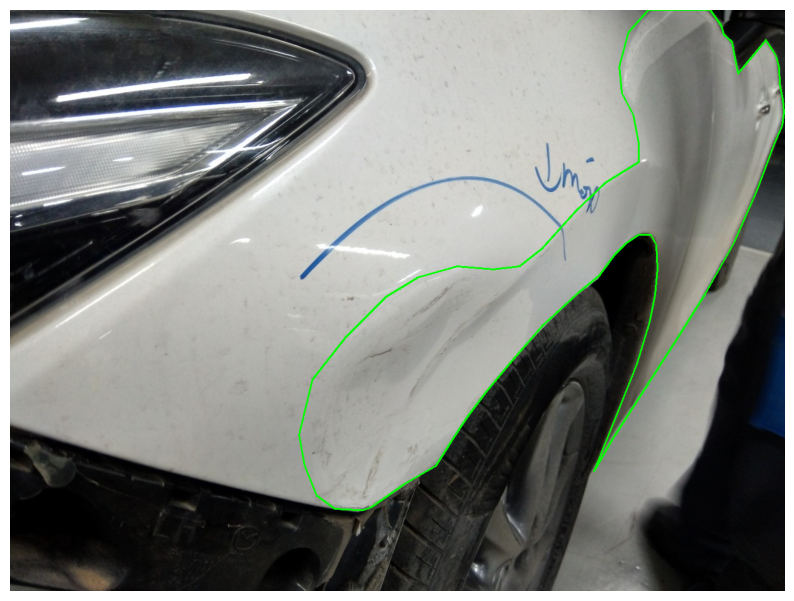

05012020_094309image486967.jpg


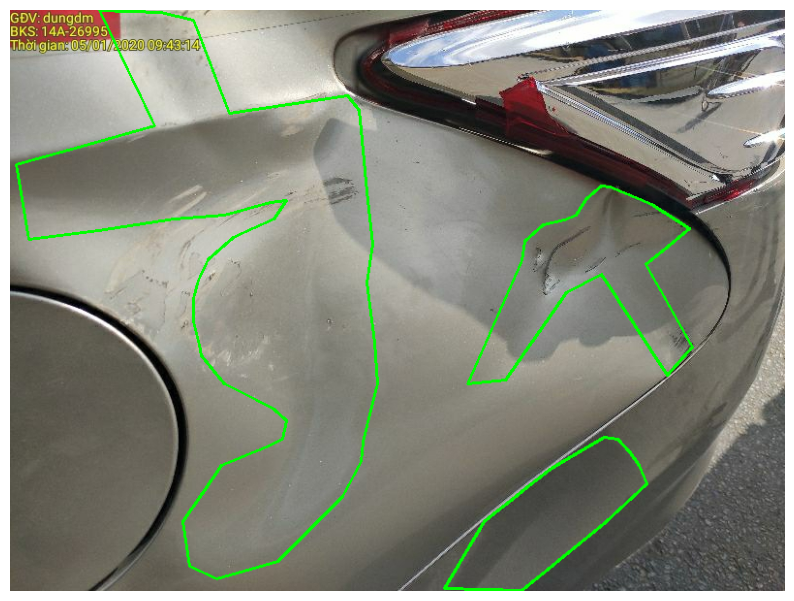

06012020_094818image512718.jpg


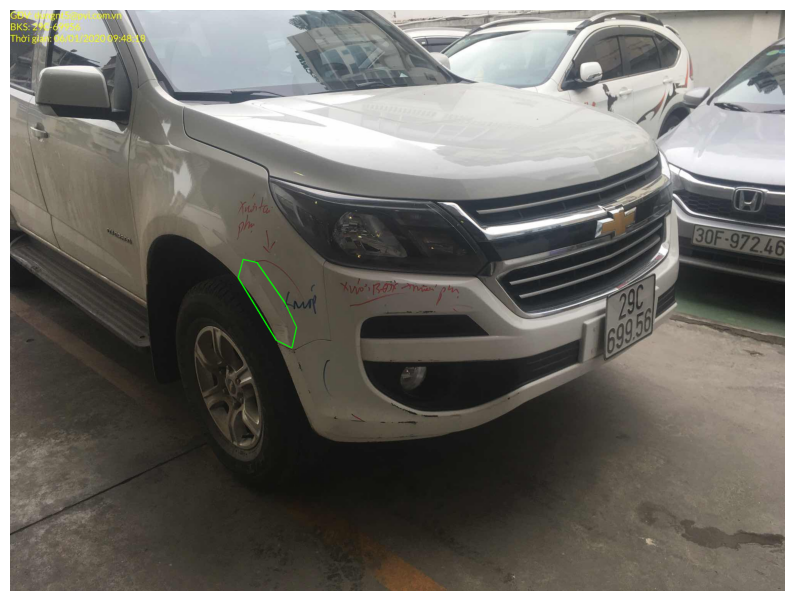

09012020_113348image776226.jpg


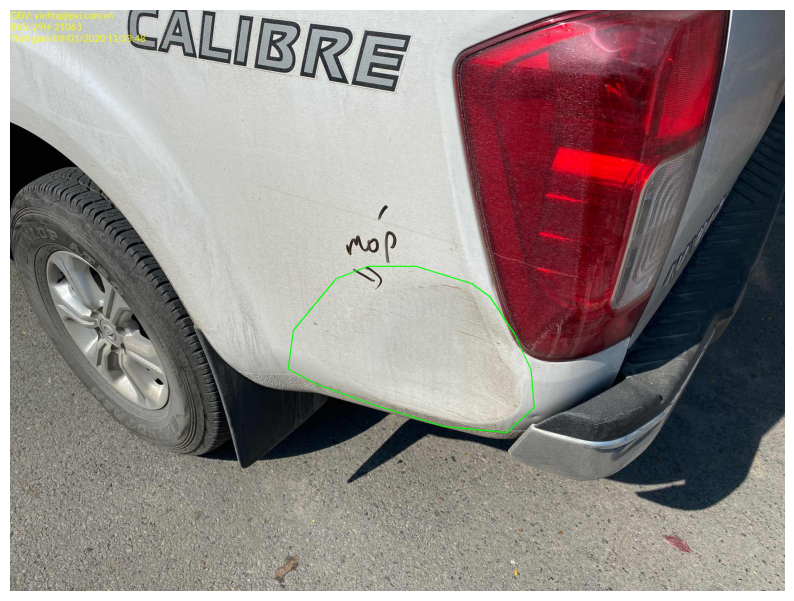

17012020_140714image186556.jpg


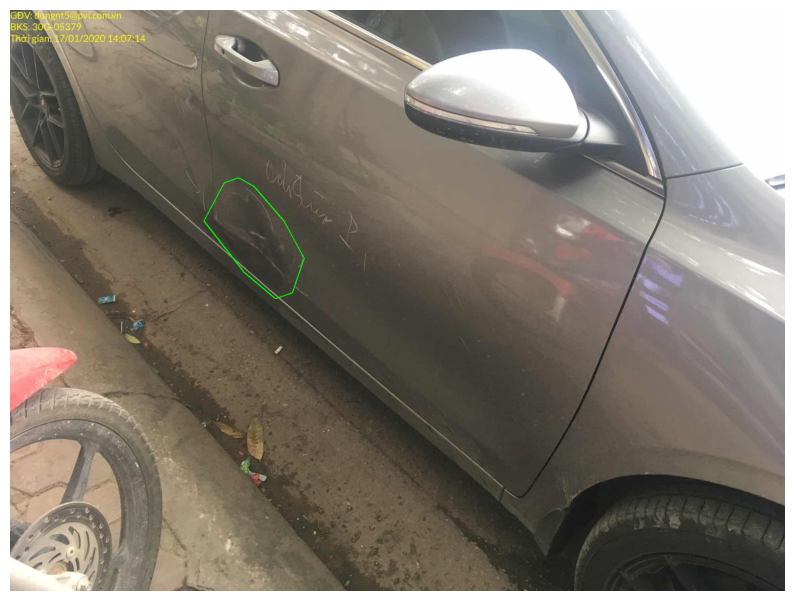

18012020_085345image384592.jpg


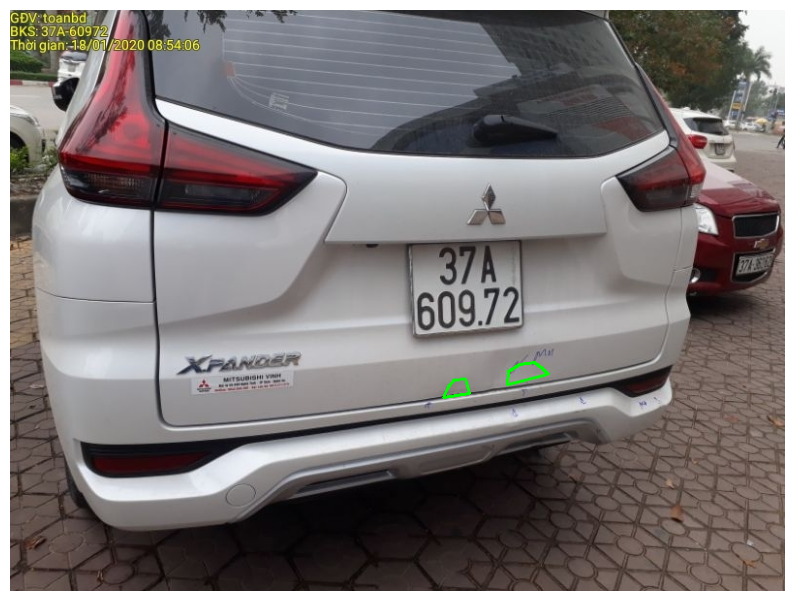

27102020_083317image810339.jpg


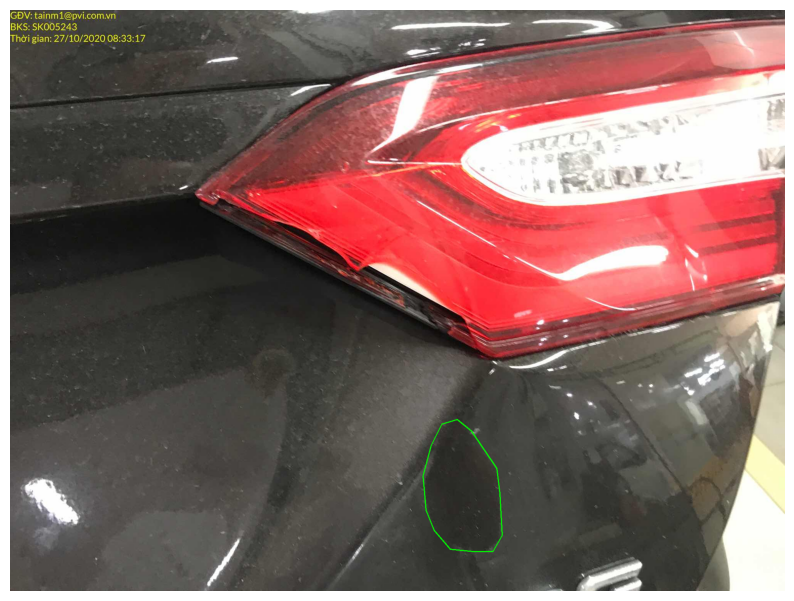

02012020_083559image910979.jpg


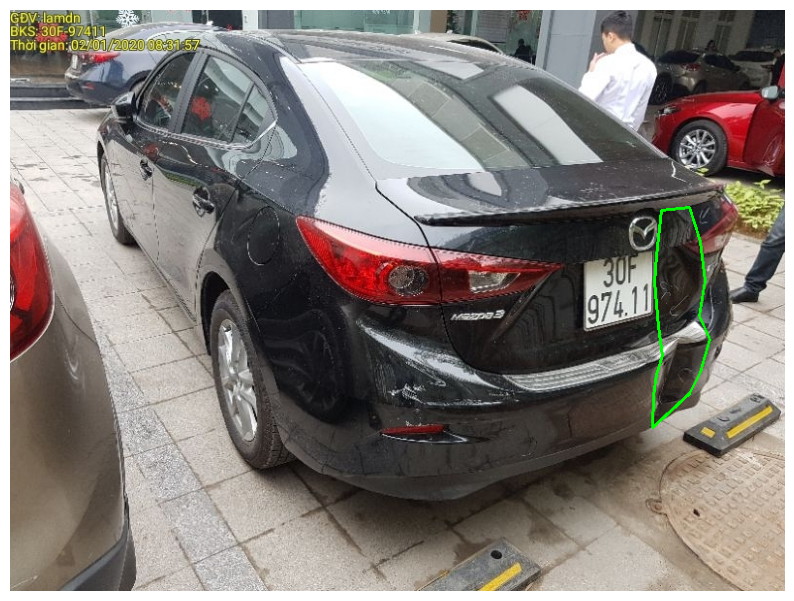

06012020_165847image580492.jpg


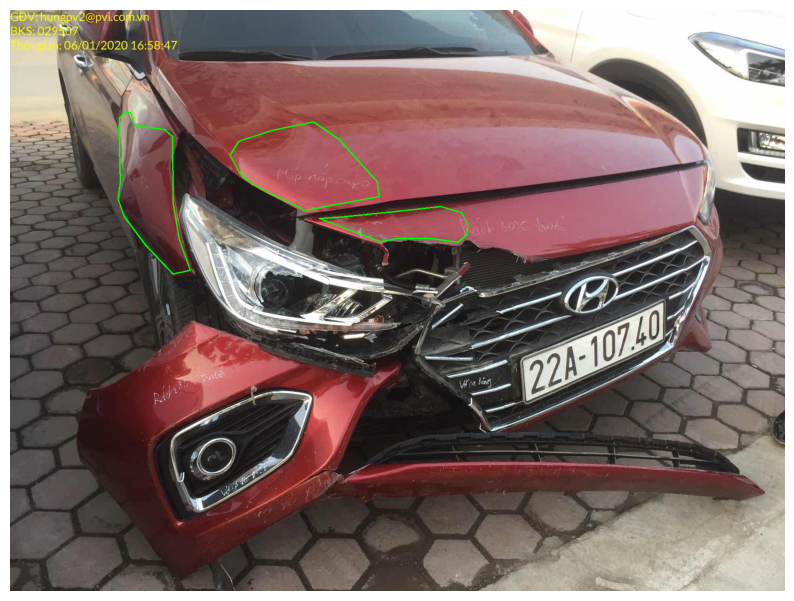

06102020_114923image163235.jpg


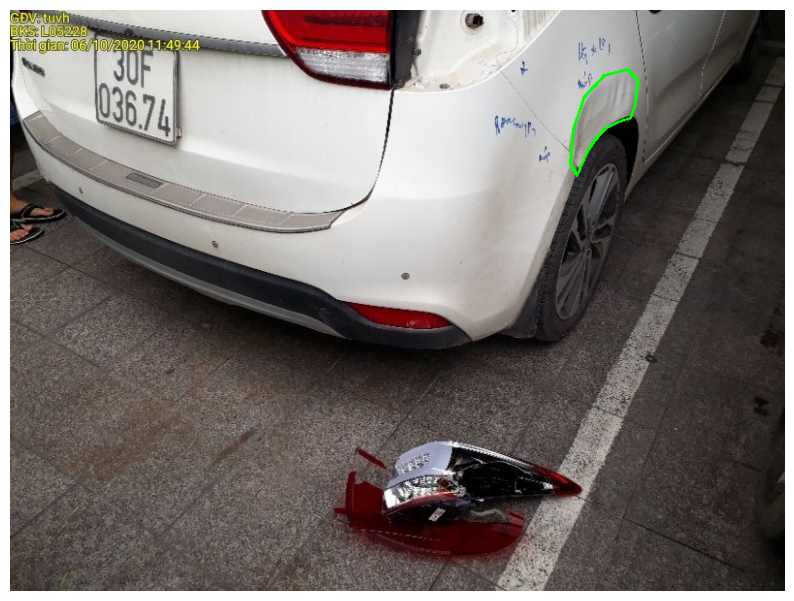

03022020_092643image622492.jpg


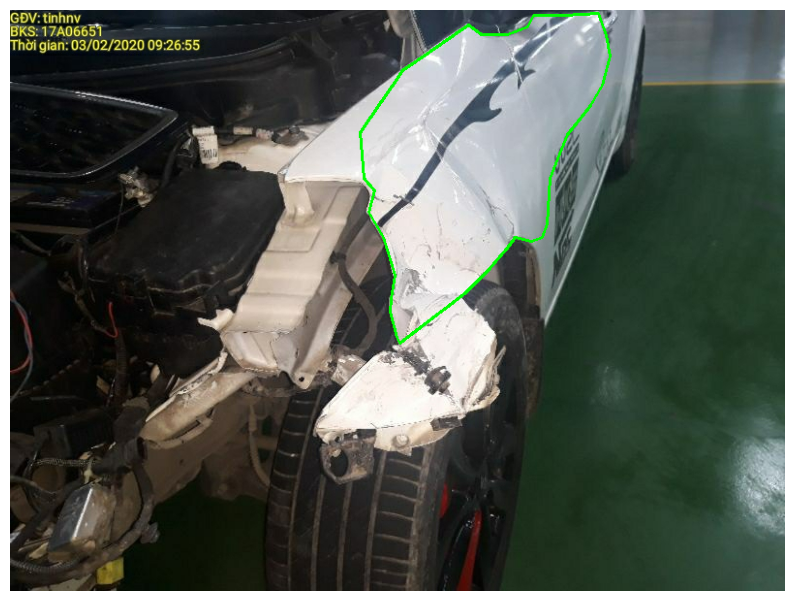

07012020_090309image396034.jpg


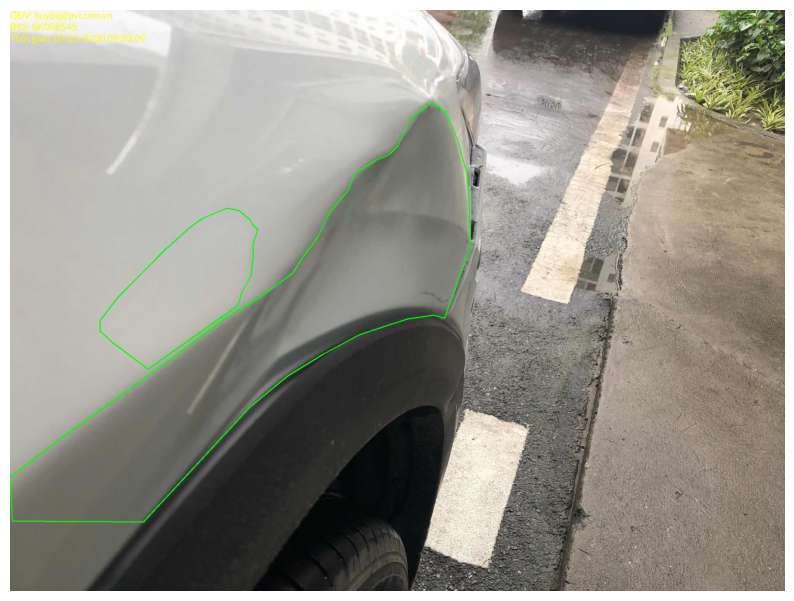

10012020_141346image267380.jpg


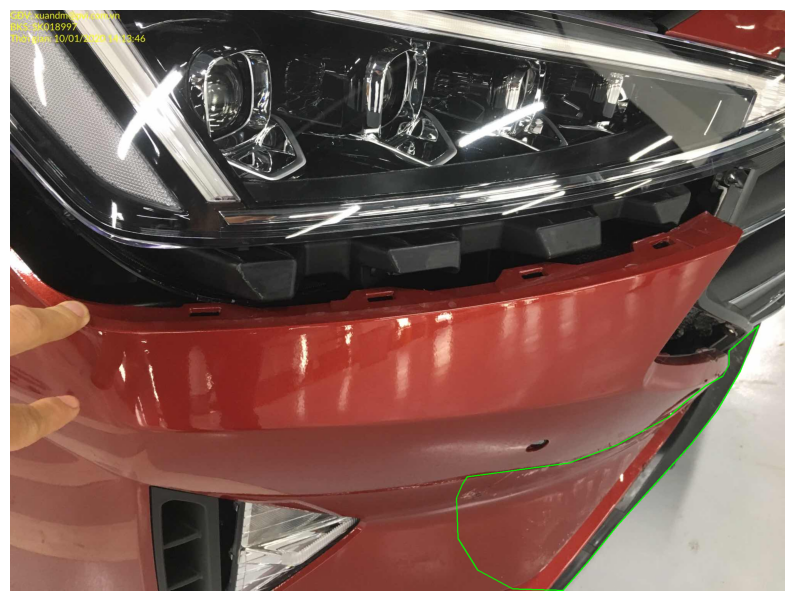

16012020_094833image757245.jpg


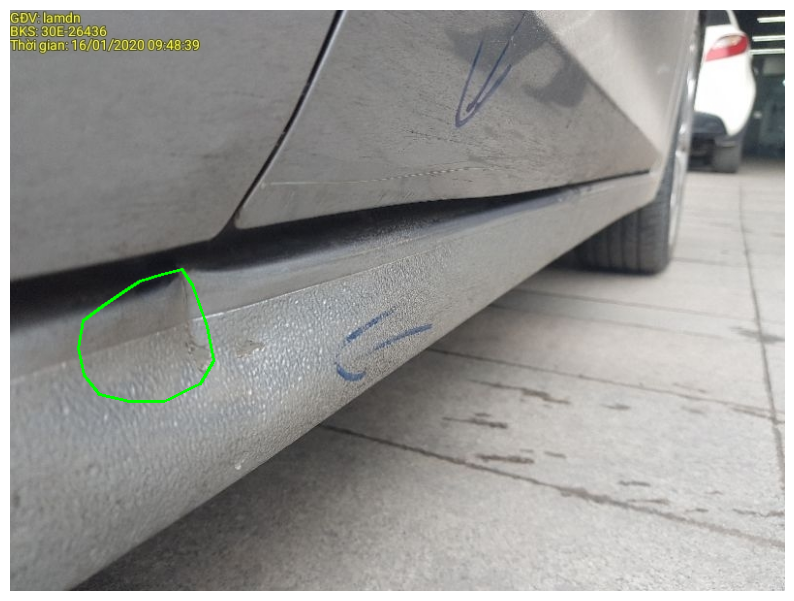

07012020_171358image360068.jpg


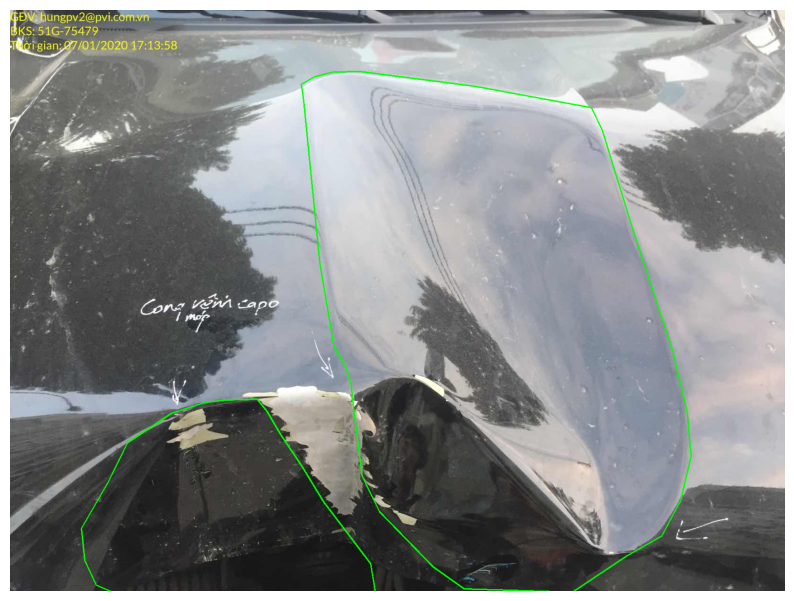

18012020_084708image875913.jpg


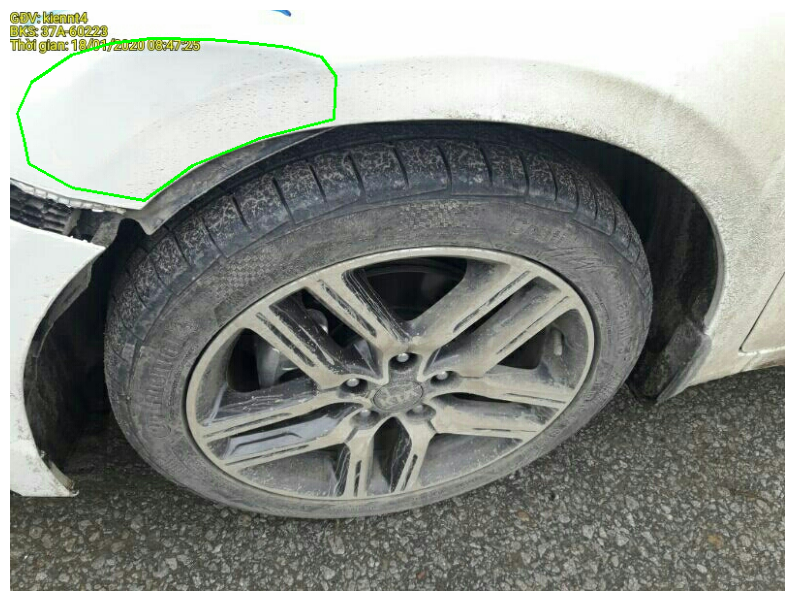

In [31]:
# Extract 10 random images from data_class
np.random.seed(1234)
image_keys = np.array(list(data_class.keys()))
random_images = np.random.choice(image_keys, size=min(20, len(image_keys)), replace=False)

# Plot each of the randomly selected images
for image_name in random_images:
    print(image_name)
    plot_photo_df(train_path_original, image_name, data_class)

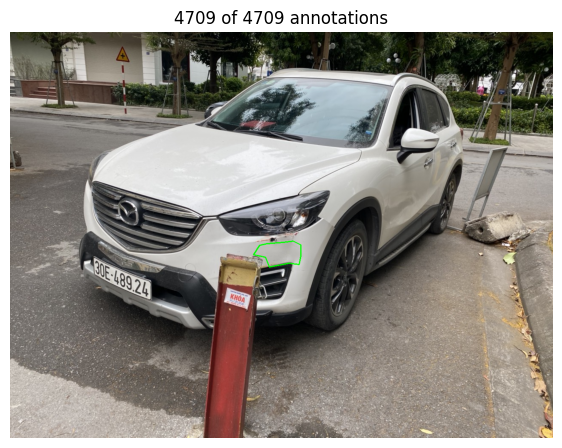

Dropdown(description='Damage:', options=(('Select classification', 0), ('Minor', 1), ('Medium', 2), ('Severe',…

Button(description='Next', style=ButtonStyle())

Output()

Updated JSON saved to .\archive\image\annotation_severity.json


IndexError: list index out of range

IndexError: list index out of range

In [ ]:
if dented_severity_apply_train == 0:
    classify_damage_and_update_json(train_path_original, train_annotations_json , class_name, output_json_severity_path)

In [42]:
if dented_severity_apply_train == 0:  
    # the old json of annotations is moved
    original_file_path = os.path.join(train_path_original, train_annotations_json)
    # the old annotations path  is moved to a new folder
    new_folder_path = os.path.join(train_path_original, folder_old_annnotations_train)
    new_file_path = os.path.join(new_folder_path, train_annotations_json)

    # Check if it exists
    if not os.path.exists(new_folder_path):
        os.makedirs(new_folder_path)

    # Move the file
    os.rename(original_file_path, new_file_path)
    print(f"The old annotations file have been moved {new_file_path}")

    # the new json is moved to the train image file
    new_file_path = os.path.join(train_path_original, train_annotations_json)
    os.rename(output_json_severity_path, new_file_path)

    print(f"The updated annotations file have been moved {new_file_path}")


The old annotations file have been moved .\archive\image\image\old_json_train\annotations.json
The updated annotations file have been moved .\archive\image\image\annotations.json


In [44]:
# Coco json
coco_json_path = os.path.join(train_path_original, train_annotations_json)

# Count elements by categories
category_name_counts = count_category_occurrences(coco_json_path)

# Result
for category_name, count in category_name_counts.items():
    print(f"Category '{category_name}' appears {count} times in the annotations.")

Category 'mis_lost' appears 2370 times in the annotations.
Category 'met_tear' appears 4546 times in the annotations.
Category 'met_scratch' appears 12267 times in the annotations.
Category 'glass_crack' appears 1824 times in the annotations.
Category 'mis_punct' appears 2006 times in the annotations.
Category 'mis_lamp' appears 2324 times in the annotations.
Category 'met_dent_minor' appears 1351 times in the annotations.
Category 'met_dent_medium' appears 1584 times in the annotations.
Category 'met_dent_severe' appears 1774 times in the annotations.


### <font color="#62b6cb"> 2.3 Change classes' ids <a name="id23"></a>

For the mask R-CNN is good that the classes are enumerated sorted (in our case, we have id class 2 and 4 but not 3).

In [45]:
# read JSON
with open(os.path.join(train_path_original, train_annotations_json  ), "r") as f:
    coco_data = json.load(f)

coco_data["categories"]

[{'id': 1, 'name': 'mis_lost', 'supercategory': 'car_damage'},
 {'id': 2, 'name': 'met_tear', 'supercategory': 'car_damage'},
 {'id': 4, 'name': 'met_scratch', 'supercategory': 'car_damage'},
 {'id': 5, 'name': 'glass_crack', 'supercategory': 'car_damage'},
 {'id': 6, 'name': 'mis_punct', 'supercategory': 'car_damage'},
 {'id': 7, 'name': 'mis_lamp', 'supercategory': 'car_damage'},
 {'supercategory': 'met_dent', 'id': 8, 'name': 'met_dent_minor'},
 {'supercategory': 'met_dent', 'id': 9, 'name': 'met_dent_medium'},
 {'supercategory': 'met_dent', 'id': 10, 'name': 'met_dent_severe'}]

In [47]:

# Assign the new categories to coco_data
coco_data["categories"] = new_categories

# Update the category_id in annotations
for annotation in coco_data["annotations"]:
    old_id = annotation["category_id"]
    annotation["category_id"] = old_to_new_ids[old_id]

# Save the updated JSON data
with open(os.path.join(train_path_original, train_annotations_json), "w") as f:
    json.dump(coco_data, f, indent=4)

### <font color="#62b6cb"> 2.4 Split train dataset in train and validation <a name="id24"></a> 

Kaggle gives a file for validation but as we are going  to do tuning over the neural network's parameters, it is needed three sets: test, validation and train. Therefore, the validation images provided by kaggle are going to be our test set and below the train set is split in train and validation and set in a new folder to have everything clearer.

In [48]:
# read coco
with open(os.path.join(train_path_original, train_annotations_json  ), "r") as f:
    coco_data = json.load(f)

# create folder for the split
if not os.path.exists(path_split):
    os.makedirs(path_split)

coco_data.keys()

dict_keys(['info', 'licenses', 'categories', 'images', 'annotations'])

In [49]:
# Keys of coco json
info = coco_data["info"]
licenses = coco_data["licenses"]
images= coco_data['images']
annotations = coco_data['annotations']
categories = coco_data['categories']

# split images
random.seed(123)
random.shuffle(images)
num_val = int(len(images) * val_percentage)
images_val = images[:num_val]
images_train = images[num_val:]

id_images_train =[img['id'] for img in images_train]
id_images_val =[img['id'] for img in images_val]

# Split annotations
annotations_train = [annotation for annotation in annotations if int(annotation['image_id']) in id_images_train]
annotations_val = [annotation for annotation in annotations if int(annotation['image_id']) in id_images_val]

# Create dicts
data_train = {'info': info, 'licenses': licenses,  'categories': categories, 'images': images_train, 'annotations': annotations_train}
data_val = {'info': info, 'licenses': licenses,  'categories': categories, 'images': images_val, 'annotations': annotations_val}


path_train_split =  os.path.join(path_split, folder_train_split)

path_val_split = os.path.join(path_split, folder_val_split)

# create folders in CustomImages
if not os.path.exists( path_train_split):
    os.makedirs(path_train_split )

if not os.path.exists( path_val_split ):
    os.makedirs( path_val_split )
                



with open(os.path.join(path_train_split, train_annotations_json), 'w') as f:
    json.dump(data_train, f, indent=4)

with open(os.path.join(path_val_split, val_annotations_json), 'w') as f:
    json.dump(data_val, f, indent=4)

# Count elements by categories
category_name_counts = count_category_occurrences(os.path.join(path_train_split, train_annotations_json))
print("Train set")
for category_name, count in category_name_counts.items():
    print(f"Category '{category_name}' appears {count} times in the annotations.")

print("\n Val set")
category_name_counts = count_category_occurrences(os.path.join(path_val_split, val_annotations_json))
for category_name, count in category_name_counts.items():
    print(f"Category '{category_name}' appears {count} times in the annotations.")


for img in images_train:
    shutil.copy(os.path.join(train_path_original, img['file_name']), os.path.join(path_train_split, img['file_name']))

for img in images_val:
    shutil.copy(os.path.join(train_path_original, img['file_name']), os.path.join(path_val_split, img['file_name']))


Train set
Category 'mis_lost' appears 1911 times in the annotations.
Category 'met_tear' appears 3611 times in the annotations.
Category 'met_scratch' appears 9862 times in the annotations.
Category 'glass_crack' appears 1428 times in the annotations.
Category 'mis_punct' appears 1635 times in the annotations.
Category 'mis_lamp' appears 1866 times in the annotations.
Category 'met_dent_minor' appears 1080 times in the annotations.
Category 'met_dent_medium' appears 1252 times in the annotations.
Category 'met_dent_severe' appears 1427 times in the annotations.

 Val set
Category 'mis_lost' appears 459 times in the annotations.
Category 'met_tear' appears 935 times in the annotations.
Category 'met_scratch' appears 2405 times in the annotations.
Category 'glass_crack' appears 396 times in the annotations.
Category 'mis_punct' appears 371 times in the annotations.
Category 'mis_lamp' appears 458 times in the annotations.
Category 'met_dent_minor' appears 271 times in the annotations.
Ca

## <font color="#62b6cb"> 3. Test data <a name="id3"></a> 


Now that we have dealed with the train set. We will focus on the test


### <font color="#62b6cb"> 3.1 Read dataset <a name="id31"></a> 

read val.json and convert into annotations COCO format

In [50]:
# Read the JSON file
with open(kaggle_json_val, "r") as file:
    data = json.load(file)

# Prepare the list to store the extracted information
data_list = []

# keys of data are the name of images
# Extract information from the JSON data

for image_name, image_info in data.items():
    for region in image_info["regions"]:
        region_data = {
            "name": image_name,
            "all_x": region["all_x"],
            "all_y": region["all_y"],
            "class": region["class"]
        }
        data_list.append(region_data)

# Create a DataFrame from the extracted information
df_test = pd.DataFrame(data_list)

In [51]:
df_test["class"] = df_test["class"].replace(mapping)


print("Number of elments classification test:",df_test.shape)
print("Number of photos test:", len(df_test["name"].unique()))
print(df_test["class"].value_counts())

Number of elments classification test: (6035, 4)
Number of photos test: 2324
class
met_scratch    2380
met_dent        972
met_tear        963
mis_lamp        458
mis_lost        448
mis_punct       417
glass_crack     397
Name: count, dtype: int64


In [52]:
# The calculation of the boxes is done to each row (each damage)
bounding_boxes = df_test.apply(calculate_bounding_box, axis=1)

# add the boxes to the dataframe
df_test = df_test.join(bounding_boxes)
df_test.head(2)

,name,all_x,all_y,class,x_rect,y_rect,width_rect,height_rect
0,01022020_104459image894113.jpg,"[894, 933, 953, 986, 989, 1009, 1035, 1053, 11...","[729, 784, 773, 725, 690, 675, 672, 634, 641, ...",met_tear,839,565,325,219
1,01022020_104459image894113.jpg,"[355, 332, 325, 324, 306, 270, 245, 244, 332, ...","[735, 729, 708, 660, 641, 637, 616, 595, 591, ...",met_tear,59,577,296,165


### <font color="#62b6cb"> 3.2 Coco format  <a name="id32"></a> 

In [54]:
# For being able to apply the augmentation, the json of the training needs to be in coco format and the width and
# height has to be in the dataframe

df_test["width"] = pd.NA
df_test["height"] = pd.NA

# name of test images
img_names = os.listdir(test_path_original)

# adding the width and the height of each of the images
for name in img_names:
    img_path = os.path.join(test_path_original, name)
    img = cv2.imread(img_path)

    if img is not None:
        height, width, _ = img.shape
        df_test.loc[df_test[df_test["name"] == name].index, "width" ] = width
        df_test.loc[df_test[df_test["name"] == name].index, "height" ]= height

In [55]:
df_test['class'].value_counts()

class
met_scratch    2380
met_dent        972
met_tear        963
mis_lamp        458
mis_lost        448
mis_punct       417
glass_crack     397
Name: count, dtype: int64

In [56]:
# Convert to coco format json
coco_format = dataframe_to_coco_format(df_test, list(df_test["class"].unique()))
coco_json = json.dumps(coco_format, indent=4)

# Save to a JSON file
with open(os.path.join(test_path_original, test_annotations_json ), "w") as f:
    f.write(coco_json)

df_test.to_csv("df_test_width_height.csv")

### <font color="#62b6cb"> 3.3 Breaking down a damage class by severity  <a name="id33"></a> 

In [57]:
# read JSON
with open(os.path.join(test_path_original, test_annotations_json ), "r") as f:
    coco_data = json.load(f)

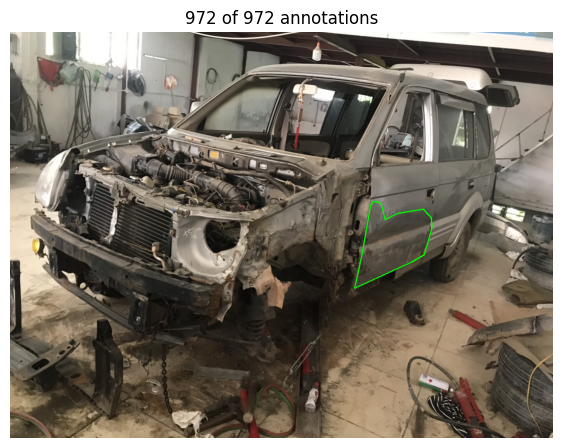

Dropdown(description='Damage:', options=(('Select classification', 0), ('Minor', 1), ('Medium', 2), ('Severe',…

Button(description='Next', style=ButtonStyle())

Output()

Updated JSON saved to .\archive\validation\annotation_severity.json


In [ ]:
if dented_severity_apply_test == 0:
    classify_damage_and_update_json(test_path_original, test_annotations_json , class_name, output_json_severity_path_test)

In [61]:
# the old json of annotations is moved
if dented_severity_apply_test == 0:
    original_file_path = os.path.join(test_path_original, test_annotations_json)
    # the old annotations path  is moved to a new folder
    new_folder_path = os.path.join(test_path_original, folder_old_annnotations_test)
    new_file_path = os.path.join(new_folder_path, test_annotations_json)
    # Check if it exists
    if not os.path.exists(new_folder_path):
        os.makedirs(new_folder_path)

    # Move the file
    os.rename(original_file_path, new_file_path)

    print(f"The file have been moved {new_file_path}")

    # the new json is moved to the test image file
    new_file_path = os.path.join(test_path_original, test_annotations_json)

    # Move the file
    os.rename(output_json_severity_path_test, new_file_path)

    print(f"The file have been moved {new_file_path}")

    dented_severity_apply_test = 1

The file have been moved .\archive\validation\validation\old_json_test\annotations.json
The file have been moved .\archive\validation\validation\annotations.json


In [62]:
# Coco json
coco_json_path = os.path.join(test_path_original, test_annotations_json)

# Count elements by categories
category_name_counts = count_category_occurrences(coco_json_path)

# Result
for category_name, count in category_name_counts.items():
    print(f"Category '{category_name}' appears {count} times in the annotations.")

Category 'met_tear' appears 963 times in the annotations.
Category 'met_scratch' appears 2380 times in the annotations.
Category 'glass_crack' appears 397 times in the annotations.
Category 'mis_lost' appears 448 times in the annotations.
Category 'mis_punct' appears 417 times in the annotations.
Category 'mis_lamp' appears 458 times in the annotations.
Category 'met_dent_minor' appears 257 times in the annotations.
Category 'met_dent_medium' appears 344 times in the annotations.
Category 'met_dent_severe' appears 371 times in the annotations.


### <font color="#62b6cb"> 3.4 Change classes' ids  <a name="id34"></a> 



The id of the categories is not in the same order that in the train json so we change it so everything is correct

In [63]:

# categories train
new_categories

[{'id': 1, 'name': 'mis_lost', 'supercategory': 'car_damage'},
 {'id': 2, 'name': 'met_tear', 'supercategory': 'car_damage'},
 {'id': 3, 'name': 'met_scratch', 'supercategory': 'car_damage'},
 {'id': 4, 'name': 'glass_crack', 'supercategory': 'car_damage'},
 {'id': 5, 'name': 'mis_punct', 'supercategory': 'car_damage'},
 {'id': 6, 'name': 'mis_lamp', 'supercategory': 'car_damage'},
 {'id': 7, 'name': 'met_dent_minor', 'supercategory': 'met_dent'},
 {'id': 8, 'name': 'met_dent_medium', 'supercategory': 'met_dent'},
 {'id': 9, 'name': 'met_dent_severe', 'supercategory': 'met_dent'}]

In [65]:
with open(os.path.join(test_path_original, test_annotations_json  ), "r") as f:
    coco_data = json.load(f)

# categories test
coco_data["categories"]

[{'id': 1, 'name': 'met_tear', 'supercategory': 'car_damage'},
 {'id': 2, 'name': 'met_scratch', 'supercategory': 'car_damage'},
 {'id': 3, 'name': 'glass_crack', 'supercategory': 'car_damage'},
 {'id': 4, 'name': 'mis_lost', 'supercategory': 'car_damage'},
 {'id': 5, 'name': 'mis_punct', 'supercategory': 'car_damage'},
 {'id': 7, 'name': 'mis_lamp', 'supercategory': 'car_damage'},
 {'supercategory': 'met_dent', 'id': 8, 'name': 'met_dent_minor'},
 {'supercategory': 'met_dent', 'id': 9, 'name': 'met_dent_medium'},
 {'supercategory': 'met_dent', 'id': 10, 'name': 'met_dent_severe'}]

In [66]:
# Create a mapping from old category IDs to new category IDs
old_to_new_id_map = {
    4: 1,  # mis_lost
    1: 2,  # met_tear
    2: 3,  # met_scratch
    3: 4,  # glass_crack
    5: 5,  # mis_punct
    7: 6,  # mis_lamp
    8: 7,  # met_dent_minor
    9: 8,  # met_dent_medium
    10: 9  # met_dent_severe
}

# Update the categories in the COCO data
coco_data["categories"] = new_categories

# Update the annotations with the new category IDs
for annotation in coco_data["annotations"]:
    old_id = annotation["category_id"]
    if old_id in old_to_new_id_map:
        annotation["category_id"] = old_to_new_id_map[old_id]

# Save the updated JSON file
with open(os.path.join(test_path_original, test_annotations_json), "w") as f:
    json.dump(coco_data, f, indent=4)

print(f"Updated JSON saved to {os.path.join(test_path_original, test_annotations_json)}")

Updated JSON saved to .\archive\validation\validation\annotations.json


### <font color="#62b6cb"> 3.5 Test folder ids  <a name="id35"></a> 

The data and annotations are copy in a test folder in CustomImages

In [75]:
os.path.join(path_test_split ,test_annotations_json)

'.\\CustomImages\\test\\annotations.json'

In [77]:
path_test_split = os.path.join(path_split, folder_test_split)
if not os.path.exists( path_test_split ):
    os.makedirs( path_test_split )

# Read the COCO format JSON file
with open(os.path.join(test_path_original, test_annotations_json  ), "r") as f:
    coco_data = json.load(f)

# Copy the JSON file to the destination directory
shutil.copy2(os.path.join(test_path_original, test_annotations_json), os.path.join(path_test_split, test_annotations_json))

# Create a set of all image filenames in the JSON file
image_filenames = {image["file_name"] for image in coco_data["images"]}

# Copy each image file to the destination directory
for image_filename in image_filenames:
    src_image_path = os.path.join(test_path_original, image_filename)
    dest_image_path = os.path.join(path_test_split, image_filename)
    
    # Check if the image file exists in the source directory before copying
    if os.path.exists(src_image_path):
        shutil.copy2(src_image_path, dest_image_path)
    else:
        print(f"Warning: {src_image_path} does not exist and will not be copied.")

print(f"All specified images and {test_annotations_json} copied to {path_test_split}.")

All specified images and annotations.json copied to .\CustomImages\test.


In [78]:
print("\n Test set")
category_name_counts = count_category_occurrences(os.path.join(path_test_split, test_annotations_json))
for category_name, count in category_name_counts.items():
    print(f"Category '{category_name}' appears {count} times in the annotations.")




 Test set
Category 'mis_lost' appears 448 times in the annotations.
Category 'met_tear' appears 963 times in the annotations.
Category 'met_scratch' appears 2380 times in the annotations.
Category 'glass_crack' appears 397 times in the annotations.
Category 'mis_punct' appears 417 times in the annotations.
Category 'mis_lamp' appears 458 times in the annotations.
Category 'met_dent_minor' appears 257 times in the annotations.
Category 'met_dent_medium' appears 344 times in the annotations.
Category 'met_dent_severe' appears 371 times in the annotations.
